In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Konfigurasi dataset
train_dir = '/content/drive/MyDrive/TF/train'
val_dir = '/content/drive/MyDrive/TF/val'
test_dir = '/content/drive/MyDrive/TF/test'

In [ ]:
# Preprocessing untuk training dan validation
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

# Data generator untuk training
train_generator = train_datagen.flow_from_directory(
    train_dir,  # Folder 'train' yang berisi subfolder kelas
    target_size=(224, 224),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

# Data generator untuk validasi
validation_generator = train_datagen.flow_from_directory(
    val_dir,  # Folder 'val' yang berisi subfolder kelas
    target_size=(224, 224),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

# Preprocessing untuk testing
test_datagen = ImageDataGenerator(rescale=1.0/255)

# Data generator untuk testing
test_generator = test_datagen.flow_from_directory(
    test_dir,  # Folder 'test' yang berisi subfolder kelas
    target_size=(224, 224),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

Found 880 images belonging to 4 classes.
Found 108 images belonging to 4 classes.
Found 112 images belonging to 4 classes.


In [ ]:
# Memuat MobileNetV2 pre-trained
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Membekukan seluruh lapisan awal
base_model.trainable = False

# Membuka beberapa lapisan terakhir untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Membekukan lapisan awal
    layer.trainable = False

# Menambahkan lapisan klasifikasi di atas model pre-trained
model = Sequential([
    base_model,  # MobileNetV2 dengan beberapa lapisan terbuka
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Dropout lebih tinggi untuk mengurangi overfitting
    Dense(4, activation='softmax')  # Output sesuai jumlah kelas
])



In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# Menyusun model dengan optimizer Adam yang memiliki learning rate
initial_learning_rate = 0.00001  # Atur nilai awal learning rate
optimizer = Adam(learning_rate=initial_learning_rate)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Menambahkan callback ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',  # Parameter yang dipantau
    factor=0.5,          # Faktor pengurangan learning rate
    patience=2,          # Berapa epoch tanpa perbaikan sebelum learning rate dikurangi
    min_lr=1e-6          # Learning rate minimum
)

# Melatih model dengan data yang sudah disiapkan
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        #reduce_lr  # Callback untuk menurunkan learning rate
    ]
)

# Evaluasi model pada data test
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Accuracy: {test_acc*100:.2f}%')


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.3325 - loss: 1.5628 - val_accuracy: 0.4271 - val_loss: 1.2598
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5625 - loss: 1.1444 - val_accuracy: 0.4167 - val_loss: 1.2320
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.4511 - loss: 1.2117 - val_accuracy: 0.6458 - val_loss: 0.9516
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 134ms/step - accuracy: 0.6562 - loss: 0.8542 - val_accuracy: 0.6667 - val_loss: 0.7362
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.6152 - loss: 0.9523 - val_accuracy: 0.8229 - val_loss: 0.7454
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6875 - loss: 0.8222 - val_accuracy: 0.8333 - val_loss: 0.6646
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.7889 - loss: 0.6586 - val_accuracy: 0.9167 - val_loss: 0.5375
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8438 - loss: 0.5256 - val_accuracy: 1.000

In [ ]:
# Menyimpan model yang telah dilatih
model.save('TF100.keras')

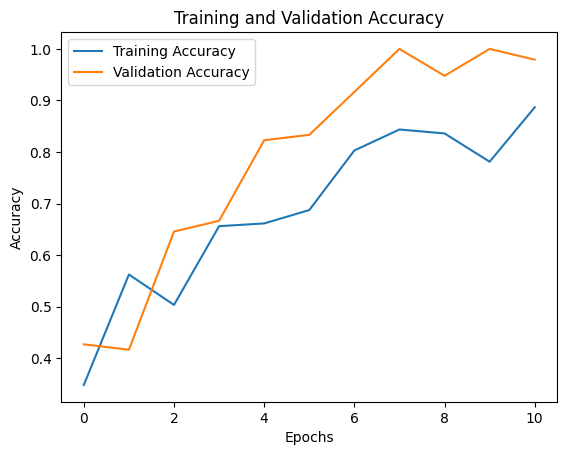

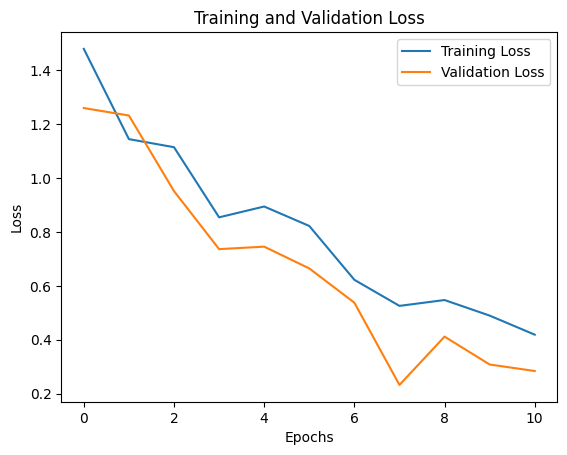

In [ ]:
import matplotlib.pyplot as plt

# Visualisasi akurasi dan loss selama pelatihan
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Found 112 images belonging to 4 classes.
112/112 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step


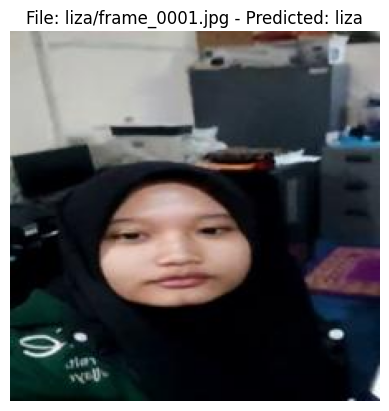

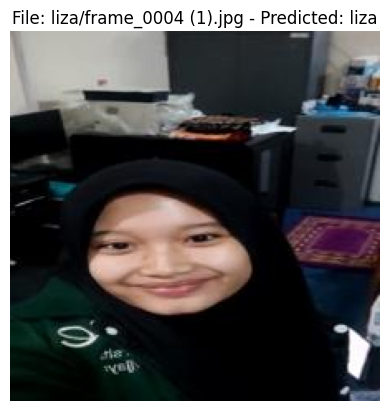

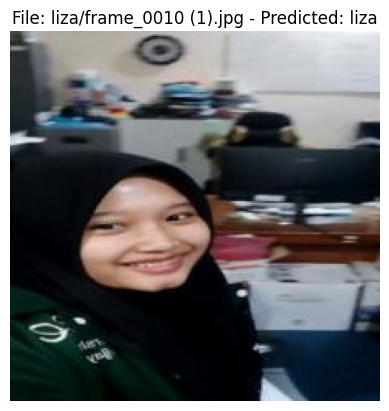

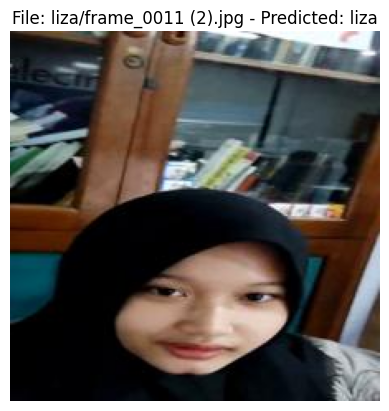

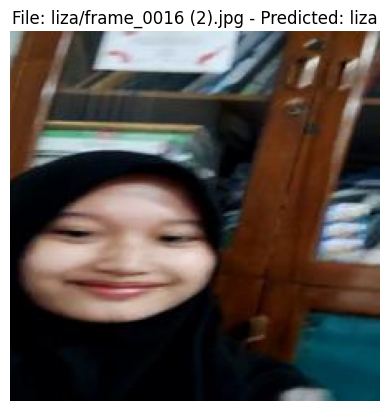

...

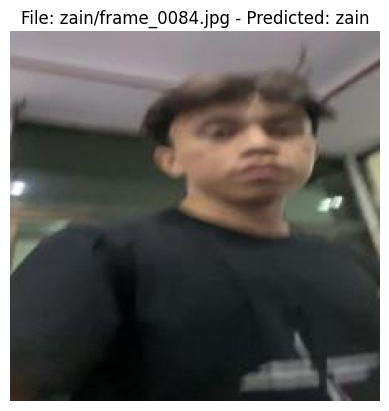

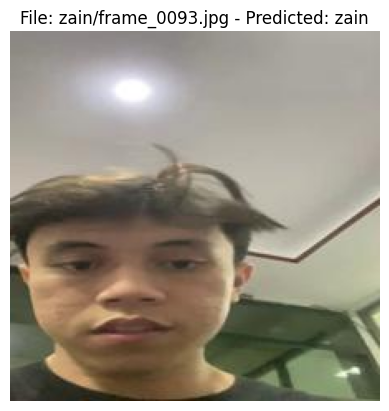

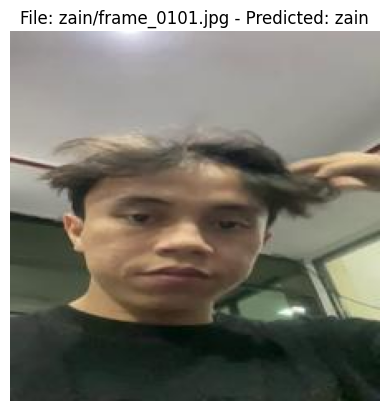

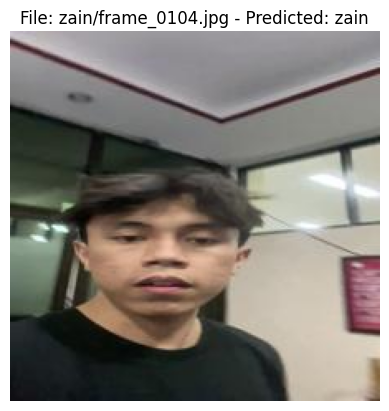

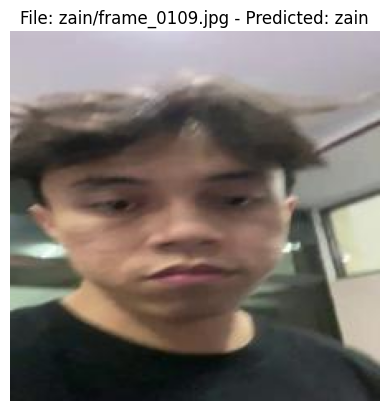

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

# Path ke direktori test set
test_dir = '/content/drive/MyDrive/TF/test'
# Menyiapkan test datagen
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Memuat data test
test_data = test_datagen.flow_from_directory(
    test_dir,
    color_mode='rgb',  # Sesuaikan dengan konfigurasi model Anda
    target_size=(224, 224),  # Sesuaikan dengan input size model
    batch_size=1,
    class_mode='categorical',  # Sesuaikan dengan tipe klasifikasi (categorical untuk 5 kelas)
    shuffle=False
)

# Prediksi pada test set
predictions = model.predict(test_data, batch_size=16)

# Mengambil nama file gambar yang ada pada test set
filenames = test_data.filenames

# Mengonversi prediksi (array probabilitas) ke dalam label kelas
predicted_classes = np.argmax(predictions, axis=1)

# Label kelas sesuai dengan urutan di test_data.class_indices
class_labels = list(test_data.class_indices.keys())

# Menampilkan prediksi dengan gambar
for i in range(112):  # Sesuaikan jumlah gambar yang ingin ditampilkan
    img_path = f"{test_dir}/{filenames[i]}"
    img = image.load_img(img_path, target_size=(224, 224), color_mode='rgb')
    plt.imshow(img, cmap='gray')  # Menampilkan gambar dalam mode grayscale
    predicted_label = class_labels[predicted_classes[i]]
    plt.title(f"File: {filenames[i]} - Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()

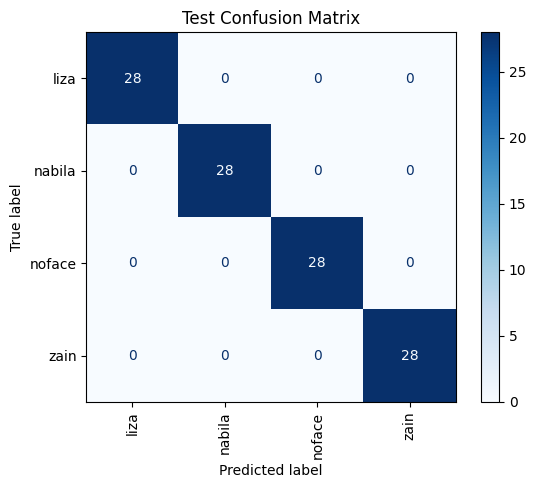

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Fungsi untuk membuat dan menampilkan confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes, title="Confusion Matrix"):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(classes)))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap=plt.cm.Blues, xticks_rotation="vertical")
    plt.title(title)
    plt.show()

# Label ground truth dari test dataset
y_true_test = test_data.classes  # Label sebenarnya dari dataset test

# Prediksi model (sudah dihitung sebelumnya)
y_pred_test = predicted_classes  # Hasil prediksi model

# Nama kelas sesuai dengan urutan pada test_data
classes = list(test_data.class_indices.keys())

# Plot confusion matrix untuk test dataset
plot_confusion_matrix(y_true_test, y_pred_test, classes, title="Test Confusion Matrix")

In [ ]:
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model

model_path = '/content/drive/MyDrive/absensi/TF100.keras'  # Ganti sesuai lokasi model Anda
model= load_model(model_path)

# Path gambar
image_path = '/content/drive/MyDrive/absensi/liza.jpg'

# Memuat gambar menggunakan PIL
img = Image.open(image_path)

# Pastikan gambar memiliki 3 channel (ubah ke RGB jika perlu)
if img.mode != 'RGB':
    img = img.convert('RGB')

# Mengubah ukuran gambar menjadi 224x224 (sesuai input model)
img = img.resize((224, 224))

# Mengonversi gambar ke array NumPy
img_array = np.array(img)

# Normalisasi piksel gambar (0-1)
img_array = img_array / 255.0

# Tambahkan dimensi batch (model menerima input dengan dimensi (batch_size, height, width, channels))
img_array = np.expand_dims(img_array, axis=0)

# Prediksi kelas
prediction = model.predict(img_array, verbose=0)

# Map label kelas (sesuaikan dengan urutan label saat pelatihan)
class_names = ['liza', 'nabila', 'noface', 'zain']  # Sesuaikan dengan class_indices

# Ambil indeks kelas dengan probabilitas tertinggi
predicted_index = np.argmax(prediction)
predicted_class = class_names[predicted_index]
predicted_confidence = prediction[0][predicted_index] * 100  # Probabilitas dalam persen

# Cetak hasil prediksi
if predicted_confidence < 90.0:  # Ambang batas 90%
    print("Predicted Class: Tidak Terdeteksi")
else:
    print(f"Predicted Class: {predicted_class} ({predicted_confidence:.2f}%)")

# Tampilkan probabilitas semua kelas
predicted_probabilities = {class_names[i]: round(prob * 100, 2) for i, prob in enumerate(prediction[0])}
print(f"Class Probabilities: {predicted_probabilities}")


ValueError: File not found: filepath=/content/drive/MyDrive/absensi/TF100.keras. Please ensure the file is an accessible `.keras` zip file.